In [1]:
%matplotlib inline

In [2]:
import torch
from torchvision.transforms import v2
from data import TrainDataset

In [3]:
from PIL import Image

In [4]:
import matplotlib.pyplot as plt

In [35]:
data1 = TrainDataset('./data/train/', './data/labels.csv',
                     v2.Compose([v2.Resize(224), v2.PILToTensor()]))
data2 = TrainDataset('./data/train/', './data/labels.csv',
                     v2.Compose([v2.PILToTensor(), v2.Resize(224, antialias=True)]))
data3 = TrainDataset('./data/train/', './data/labels.csv',
                     v2.Compose([v2.PILToTensor(), v2.Resize(224, antialias=False)]))

In [36]:
img1 = data1[0][0]
img2 = data2[0][0]
img3 = data3[0][0]

In [37]:
images = [img1, img2, img3]

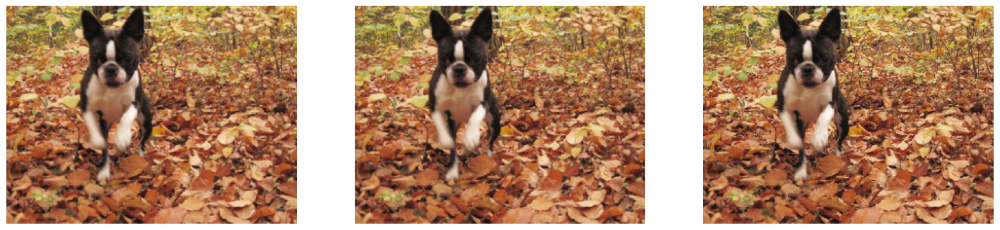

In [38]:
rows, cols = 1, 3
scale = 20
fig, axes = plt.subplots(rows, cols, figsize=(rows*scale, cols*scale))
axes = axes.flatten()
for i in range(rows * cols):
    axes[i].imshow(v2.ToPILImage()(images[i]))
    axes[i].axis('off')
plt.show()

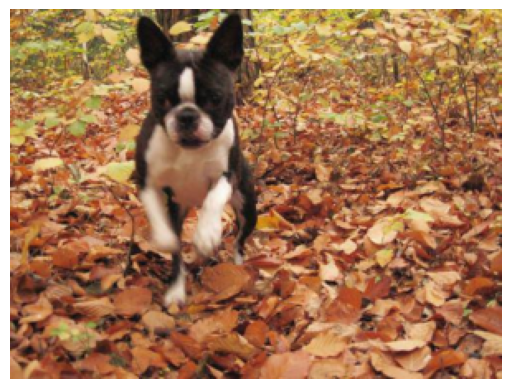

In [6]:
data = TrainDataset('./data/train/', './data/labels.csv',
                    v2.Compose([v2.Resize(224), v2.PILToTensor()]))
img = data[0][0]
plt.axis('off')
plt.imshow(img.permute(1,2,0));

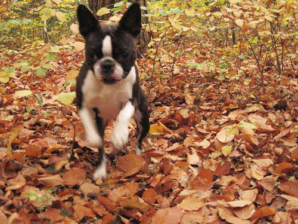

In [62]:
v2.ToPILImage()(img)

In [63]:
data.samples[0]

'./data/train/000bec180eb18c7604dcecc8fe0dba07.jpg'

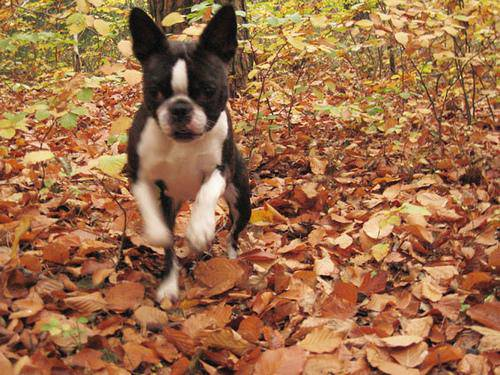

In [7]:
img = Image.open(data.samples[0])
img

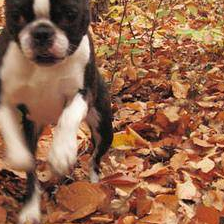

In [66]:
v2.CenterCrop(224)(img)

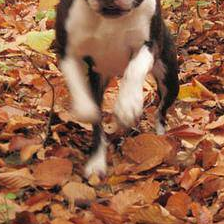

In [76]:
v2.RandomCrop(224)(img)

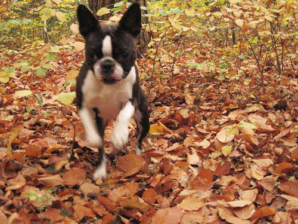

In [77]:
v2.Resize(224)(img)

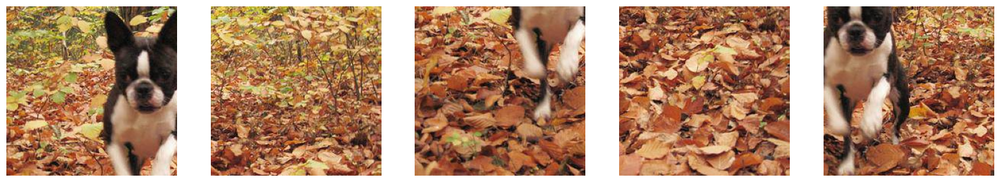

In [81]:
images = v2.FiveCrop(224)(img)
rows, cols = 1, 5
scale = 20
fig, axes = plt.subplots(rows, cols, figsize=(rows*scale, cols*scale))
axes = axes.flatten()
for i in range(rows * cols):
    axes[i].imshow(v2.ToPILImage()(images[i]))
    axes[i].axis('off')
plt.show()

In [16]:
def show_images(images, rows, cols, scale=1.5, titles=None):
    fig, axes = plt.subplots(rows, cols, figsize=(rows*scale, cols*scale))
    axes = axes.flatten()
    for i in range(rows * cols):
        axes[i].imshow(v2.ToPILImage()(images[i]))
        axes[i].axis('off')
        if titles:
            axes[i].set_title(titles[i])
    plt.show()

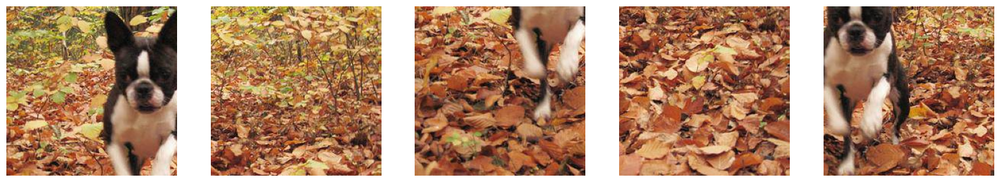

In [86]:
show_images(v2.FiveCrop(224)(img), 1, 5, 20)

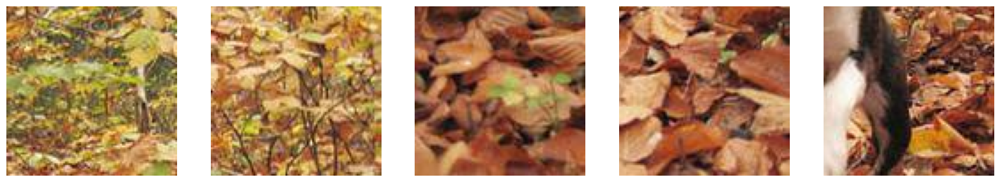

In [87]:
show_images(v2.FiveCrop(96)(img), 1, 5, 20)

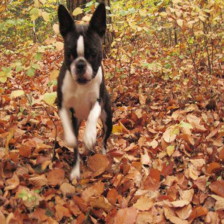

In [88]:
v2.Resize((224,224))(img)

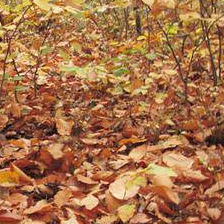

In [91]:
v2.RandomCrop(224)(img)

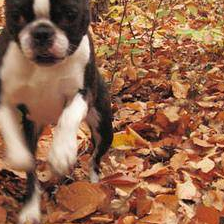

In [93]:
v2.CenterCrop(224)(img)

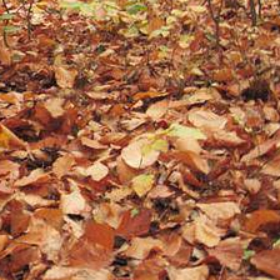

In [98]:
v2.Compose([v2.RandomCrop(224), v2.Resize(280)])(img)

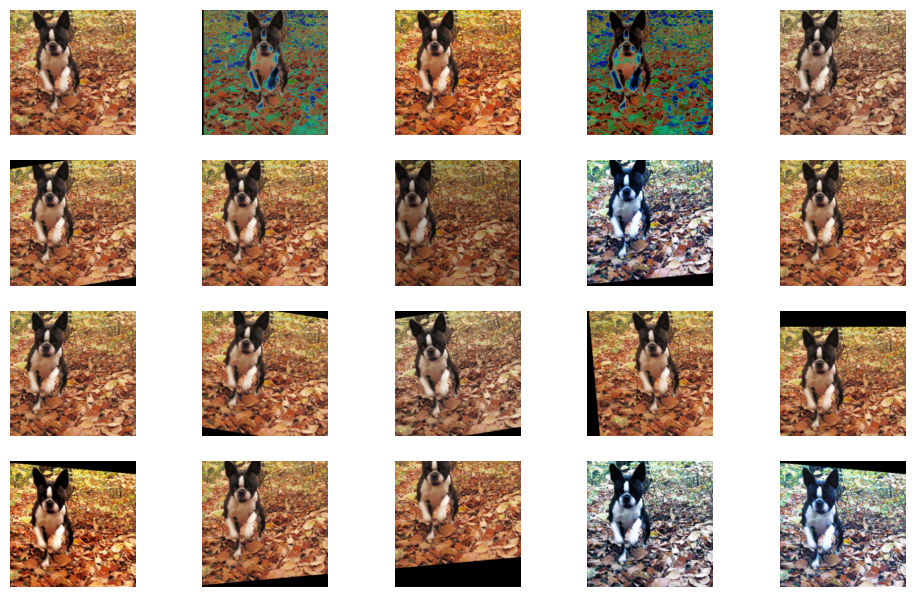

In [38]:
images = [v2.CenterCrop(224)(v2.Resize(224)(v2.RandAugment()(img))) for _ in range(20)]
rows, cols = 4, 5
scale = (3.0,1.5)
_, axes = plt.subplots(rows, cols, figsize=(rows*scale[0], cols*scale[1]))
axes = axes.flatten()
for i in range(rows * cols):
    axes[i].imshow(v2.ToPILImage()(images[i]))
    axes[i].axis('off')
plt.show()

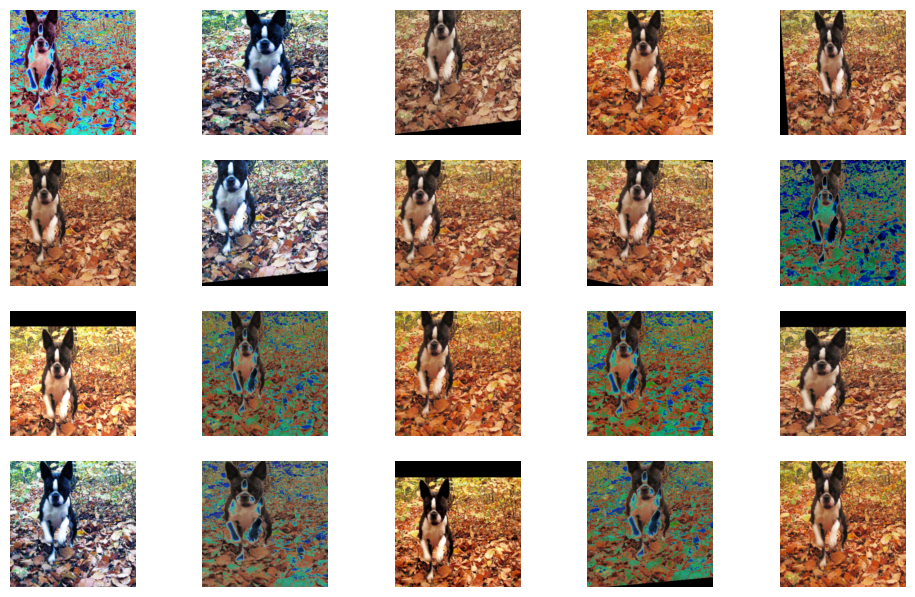

In [43]:
images = [v2.RandomResizedCrop(224, scale=(0.64, 1))(v2.RandAugment()(img)) for _ in range(20)]
rows, cols = 4, 5
scale = (3.0,1.5)
_, axes = plt.subplots(rows, cols, figsize=(rows*scale[0], cols*scale[1]))
axes = axes.flatten()
for i in range(rows * cols):
    axes[i].imshow(v2.ToPILImage()(images[i]))
    axes[i].axis('off')
plt.show()

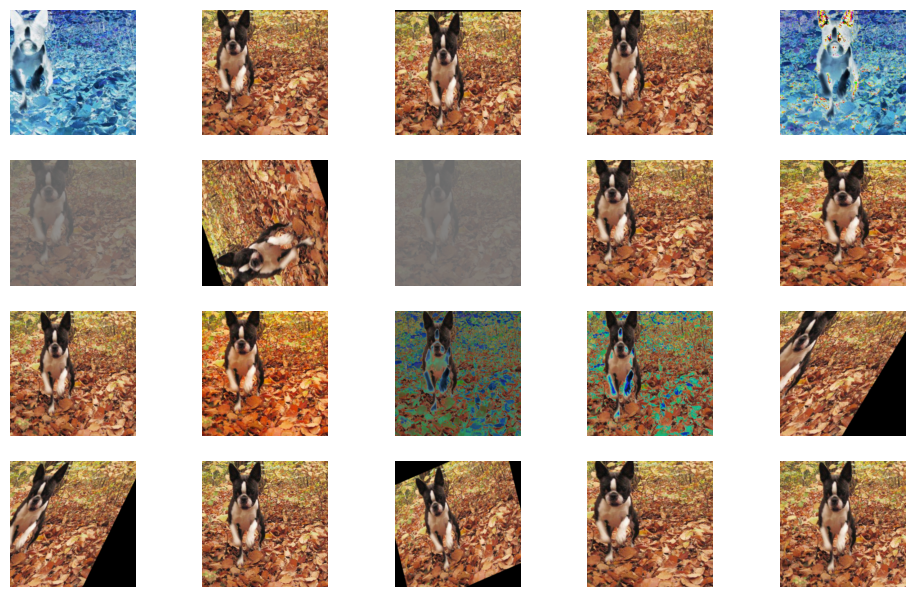

In [48]:
images = [v2.RandomResizedCrop(224, scale=(0.64, 1))(v2.TrivialAugmentWide()(img)) for _ in range(20)]
rows, cols = 4, 5
scale = (3.0,1.5)
_, axes = plt.subplots(rows, cols, figsize=(rows*scale[0], cols*scale[1]))
axes = axes.flatten()
for i in range(rows * cols):
    axes[i].imshow(v2.ToPILImage()(images[i]))
    axes[i].axis('off')
plt.show()

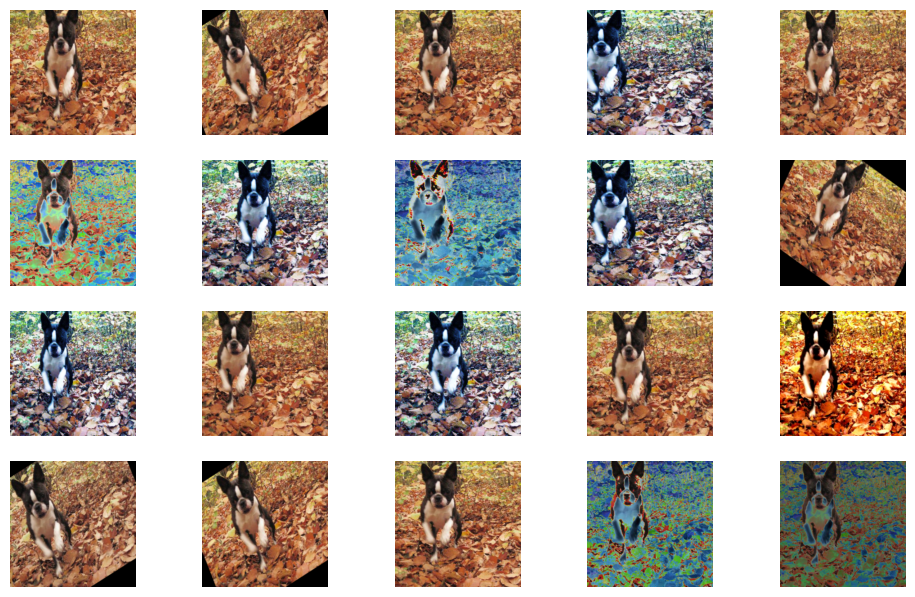

In [54]:
images = [v2.RandomResizedCrop(224, scale=(0.64, 1))(v2.AutoAugment()(img)) for _ in range(20)]
rows, cols = 4, 5
scale = (3.0,1.5)
_, axes = plt.subplots(rows, cols, figsize=(rows*scale[0], cols*scale[1]))
axes = axes.flatten()
for i in range(rows * cols):
    axes[i].imshow(v2.ToPILImage()(images[i]))
    axes[i].axis('off')
plt.show()

In [55]:
NUM_CLASSES = 120

cutmix = v2.CutMix(num_classes=NUM_CLASSES)
mixup = v2.MixUp(num_classes=NUM_CLASSES)
cutmix_or_mixup = v2.RandomChoice([cutmix, mixup])

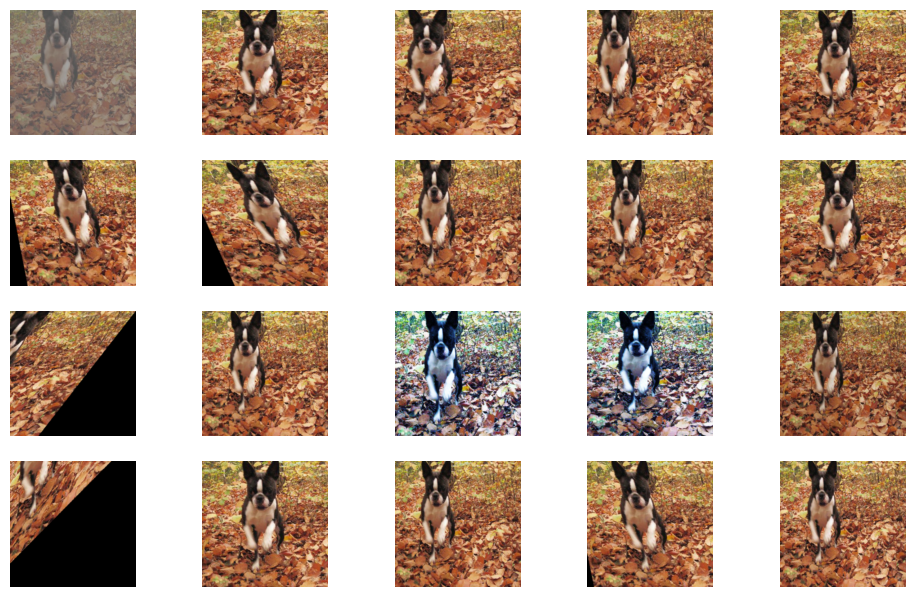

In [56]:
images = [v2.RandomResizedCrop(224, scale=(0.64, 1))(v2.TrivialAugmentWide()(img)) for _ in range(20)]
rows, cols = 4, 5
scale = (3.0,1.5)
_, axes = plt.subplots(rows, cols, figsize=(rows*scale[0], cols*scale[1]))
axes = axes.flatten()
for i in range(rows * cols):
    axes[i].imshow(v2.ToPILImage()(images[i]))
    axes[i].axis('off')
plt.show()

Five Crop

In [5]:
from data import *
import torch
from torchvision.transforms import v2

In [49]:
from torchvision import tv_tensors

In [53]:
class BatchMultiCrop(v2.Transform):
    def forward(self, samples):
        return tv_tensors.Image(torch.stack(samples))

In [69]:
predict_data = PredictDataset('./data/test', './data/sample_submission.csv',
    v2.Compose([v2.Resize(280),
                v2.FiveCrop(224),
                v2.PILToTensor(),
                BatchMultiCrop(),
                v2.ToDtype(dtype=torch.float32, scale=True),
                v2.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
                ]))

In [71]:
predict_data[5].shape

torch.Size([5, 3, 224, 224])

In [73]:
224 / 0.8

280.0